### Importing necessary Libraries and the data set.

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
from sklearn.ensemble import RandomForestRegressor

In [18]:
data = pd.read_csv('internship_train.csv')

#### Creating profile report to descover feature distribution

In [19]:
profile = pandas_profiling.ProfileReport(data)

In [36]:
profile.to_file("profile_summary.html")

Summarize dataset:   0%|          | 0/68 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Exploring the file profile_summary.html some conclutions can be made: 

<ol>
<li>Number of features is equeal to 53 and 1 variable for target feature;</li>
<li>Number of observations is equeal to 	90000;</li>
<li>There are no missing values;</li>
<li>There are no duplicates rows;</li>
<li>Almost all features have uniform distribution except 2 features number 6 and 8;</li>
<li>Data set contains 53 numerical features and 1 boolean feature.</li>
</ol>

### Understanding the variables in the data set.

In [5]:
data.head()

,0,1,2,3,4,5,6,7,8,9,...,44,45,46,47,48,49,50,51,52,target
0,236,488,16,221,382,97,-4.472136,0.107472,0,132,...,13.340874,0.870542,1.962937,7.466666,11.547794,8.822916,9.046424,7.895535,11.010677,20.107472
1,386,206,357,232,1,198,7.810250,0.763713,1,143,...,12.484882,7.168680,2.885415,12.413973,10.260494,10.091351,9.270888,3.173994,13.921871,61.763713
2,429,49,481,111,111,146,8.602325,0.651162,1,430,...,14.030257,0.394970,8.160625,12.592059,8.937577,2.265191,11.255721,12.794841,12.080951,74.651162
3,414,350,481,370,208,158,8.306624,0.424645,1,340,...,2.789577,6.416708,10.549814,11.456437,6.468099,2.519049,0.258284,9.317696,5.383098,69.424645
4,318,359,20,218,317,301,8.124038,0.767304,1,212,...,1.886560,1.919999,2.268203,0.149421,4.105907,10.416291,6.816217,8.586960,4.512419,66.767304


### Check the dimension of the given data set.

In [6]:
data.shape

(90000, 54)

### Using describe method to have information about the variables

In [8]:
data.describe()

,0,1,2,3,4,5,6,7,8,9,...,44,45,46,47,48,49,50,51,52,target
count,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,...,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000,90000.000000
mean,249.423944,250.236267,248.637289,249.736600,249.436178,249.656167,-0.011402,0.498548,0.499189,249.842033,...,7.475155,7.523962,7.508397,7.473322,7.490658,7.474578,7.509206,7.487159,7.513316,50.033981
std,144.336393,144.022200,144.107577,144.284945,143.941581,144.329168,7.038171,0.288682,0.500002,144.612718,...,4.330410,4.321537,4.331761,4.335692,4.332122,4.323035,4.326364,4.324876,4.333080,28.897243
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-9.949874,0.000014,0.000000,0.000000,...,0.000019,0.000040,0.000154,0.000083,0.000367,0.000014,0.000160,0.000147,0.000125,0.002634
25%,125.000000,126.000000,124.000000,125.000000,125.000000,124.000000,-7.071068,0.248932,0.000000,124.000000,...,3.707544,3.797002,3.760627,3.715721,3.739358,3.715298,3.773381,3.743536,3.776322,25.091903
50%,250.000000,251.000000,248.000000,250.000000,250.000000,250.000000,0.000000,0.497136,0.000000,250.000000,...,7.474127,7.533987,7.505259,7.459774,7.494167,7.477270,7.512575,7.476564,7.506812,50.030705
75%,374.000000,375.000000,374.000000,375.000000,373.000000,374.000000,7.000000,0.747513,1.000000,376.000000,...,11.216585,11.276349,11.261971,11.215637,11.239232,11.210070,11.268156,11.234414,11.277835,75.059454
max,499.000000,499.000000,499.000000,499.000000,499.000000,499.000000,9.949874,0.999987,1.000000,499.000000,...,14.999900,14.999528,14.999733,14.999478,14.999869,14.999928,14.999948,14.999364,14.999775,99.999482


<p>Exploring descriptive statistics, I assume that some features have very similar values.
<br> For example, features from *0* to *5*, from *9* to *12* and from *13* to *52*.
<br> Feature 8 has boolean values.<p>

### Plotting heat map to understand the correlation of variables 

<AxesSubplot:>

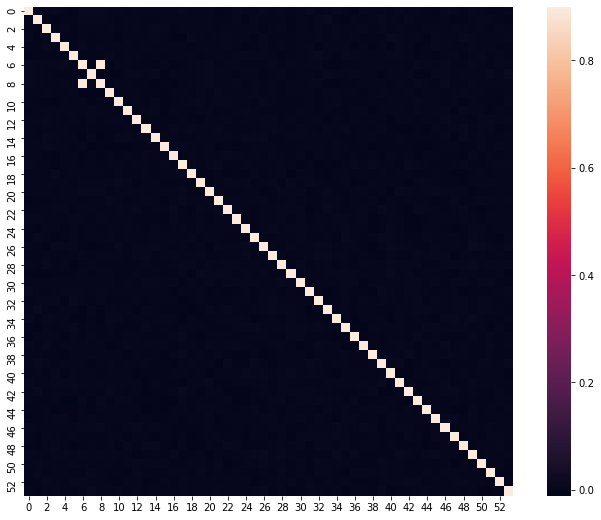

In [9]:
corr_matrix = data.corr()
plt.subplots(figsize=(12, 9))
sns.heatmap(corr_matrix, vmax=0.9, square=True)

In [21]:
corr_matrix

,0,1,2,3,4,5,6,7,8,9,...,44,45,46,47,48,49,50,51,52,target
0,1.000000,0.002009,0.001170,0.002957,-0.003764,-0.007362,0.007855,0.007174,0.008011,0.002339,...,-4.142468e-03,-6.524791e-03,0.003532,0.000310,-0.002639,0.004795,0.000287,-0.001647,-0.003612,0.002427
1,0.002009,1.000000,-0.001849,-0.004653,-0.002433,-0.002037,0.004181,0.005790,0.004095,0.002592,...,-2.874705e-03,-2.679358e-03,0.001402,-0.007900,-0.004497,0.002015,0.003119,0.006038,-0.003173,-0.005545
2,0.001170,-0.001849,1.000000,-0.000775,0.003082,-0.002161,0.002296,-0.000299,0.001983,0.005753,...,1.091757e-03,-5.881274e-04,0.000643,0.003106,0.001611,-0.001444,0.001006,-0.001753,0.002812,0.001003
3,0.002957,-0.004653,-0.000775,1.000000,-0.003623,-0.001038,0.000223,-0.004290,0.000966,0.000202,...,-5.875674e-03,4.776979e-03,0.001334,0.000528,0.006892,0.002790,0.002082,0.000373,0.002534,0.002807
4,-0.003764,-0.002433,0.003082,-0.003623,1.000000,-0.000992,0.005602,-0.004459,0.004763,-0.000778,...,-1.412970e-03,6.178204e-03,-0.000873,-0.002625,-0.001883,0.002884,-0.000702,0.001067,-0.002388,-0.001300
5,-0.007362,-0.002037,-0.002161,-0.001038,-0.000992,1.000000,-0.003869,-0.001455,-0.002289,0.004740,...,-1.159929e-03,-5.225882e-03,-0.000776,-0.000087,-0.004682,0.000988,0.004735,-0.004100,0.004946,-0.002125
6,0.007855,0.004181,0.002296,0.000223,0.005602,-0.003869,1.000000,-0.002051,0.940016,-0.007185,...,5.795666e-04,-3.255019e-05,0.005084,-0.002972,-0.002300,0.003611,0.001542,-0.000944,0.002867,0.000666
7,0.007174,0.005790,-0.000299,-0.004290,-0.004459,-0.001455,-0.002051,1.000000,0.000779,-0.007187,...,-5.102514e-03,2.936529e-03,0.003277,-0.001273,-0.000669,0.001930,0.001085,0.008363,0.001724,0.012103
8,0.008011,0.004095,0.001983,0.000966,0.004763,-0.002289,0.940016,0.000779,1.000000,-0.007370,...,3.567263e-04,-1.795987e-03,0.006837,-0.003748,-0.002903,0.004119,0.000960,0.000786,0.001725,0.000347
9,0.002339,0.002592,0.005753,0.000202,-0.000778,0.004740,-0.007185,-0.007187,-0.007370,1.000000,...,1.202068e-03,1.417241e-03,-0.002239,0.002636,0.004146,0.001255,-0.000016,-0.003785,-0.003467,0.001504


<p> Looking at the correlation matrix, values close to 1 or 1 indicate a perfect positive linear correlation between two variables, it can be observed with features 6 and 8, the correlation coefficient is 0.940016, which indicates that they’re strongly positively correlated.
<br>
<br> When two independent variables are highly correlated, this results in a problem known as multicollinearity and it can make it hard to interpret the results of the regression.
<br>
<br> All other features have close to 0 or 0 correlation, which indicates that they’re basically not correlated. 
<br>
<br> Pearson’s correlation coefficients measure only linear relationships. Consequently, if data contain a curvilinear relationship, the correlation coefficient will not detect it. For example, the correlation between feature 6 and target is 0.000666. However, there is a relationship between variables - but not linear.</p>

###  Understanding the distribution of each variable with other

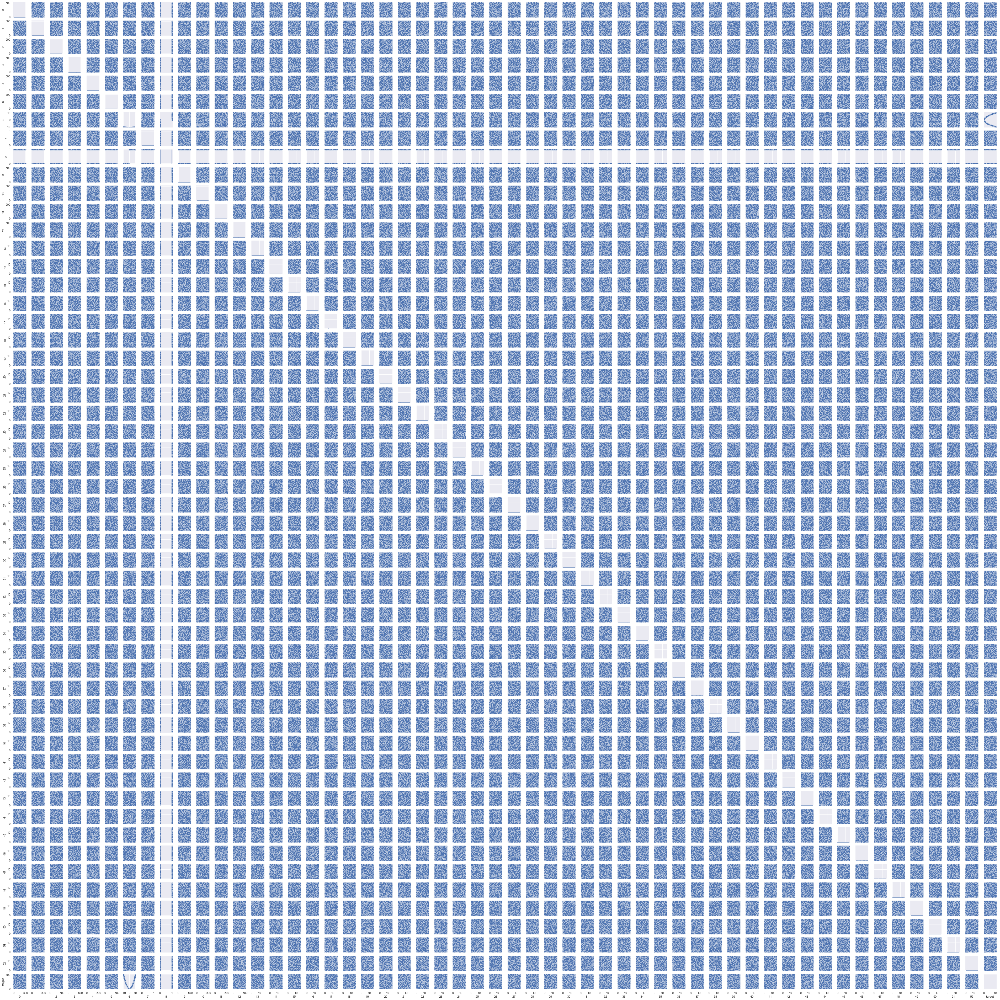

In [12]:
sns.set()
cols = data.columns[:54]
sns.pairplot(data, height = 1)
plt.show()

<p>From this plot, I can assume that the most important feature can be #6 or #8, but they are strongly correlated, so it is reasonable to use only one of them. For better understanding feature importance I will use feature selection technic later.</p>

### Understanding the distribution of the target

C:\Users\Anastasiia Selezen\Anaconda3\envs\regressionTestTask\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Distribution of target')

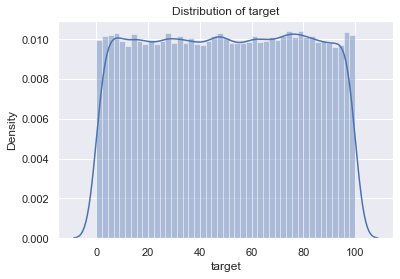

In [24]:
sns.distplot(data['target']).set_title("Distribution of target")

<p>From the plot can be concluded that the target variable has a uniform distribution.</p>

### Feature Selection

<p>To find important features, I will use the RandomForest algorithm: it randomly generates thousands of decision trees and takes turns leaving out each variable in fitting the model. This way, I can calculate how much better or worse a model does when I leave one variable out.</p>

In [26]:
# Divide data into features and target
X = data.iloc[:, :-1].values
y = data.iloc[:, -1].values

In [28]:
# Build and fit the model
rf = RandomForestRegressor()
rf.fit(X, y)

RandomForestRegressor()

In [30]:
# Print the results
print("Features sorted by their score:")
print(sorted(zip(map(lambda x: round(x, 4), rf.feature_importances_), data.columns), reverse=True))

Features sorted by their score:
[(0.9999, '6'), (0.0001, '7'), (0.0, '9'), (0.0, '8'), (0.0, '52'), (0.0, '51'), (0.0, '50'), (0.0, '5'), (0.0, '49'), (0.0, '48'), (0.0, '47'), (0.0, '46'), (0.0, '45'), (0.0, '44'), (0.0, '43'), (0.0, '42'), (0.0, '41'), (0.0, '40'), (0.0, '4'), (0.0, '39'), (0.0, '38'), (0.0, '37'), (0.0, '36'), (0.0, '35'), (0.0, '34'), (0.0, '33'), (0.0, '32'), (0.0, '31'), (0.0, '30'), (0.0, '3'), (0.0, '29'), (0.0, '28'), (0.0, '27'), (0.0, '26'), (0.0, '25'), (0.0, '24'), (0.0, '23'), (0.0, '22'), (0.0, '21'), (0.0, '20'), (0.0, '2'), (0.0, '19'), (0.0, '18'), (0.0, '17'), (0.0, '16'), (0.0, '15'), (0.0, '14'), (0.0, '13'), (0.0, '12'), (0.0, '11'), (0.0, '10'), (0.0, '1'), (0.0, '0')]


<p>From analysis it can be concluded that the most important feature is #6.
<br>
<br>The relationship between feature #6 and the target variable can be seen below.</p>

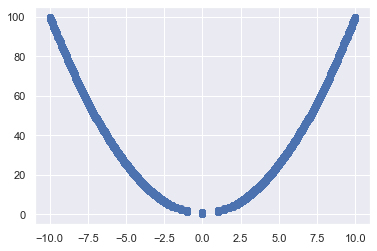

In [35]:
plt.scatter(data.iloc[:, 6], y)
plt.show()